In [1]:
import os
os.environ["CUDA_VISIBLE_DEVICES"]="1"

from PIL import Image
# from torchinfo import summary
import torch
import os
import warnings
warnings.filterwarnings("ignore")
from typing import Tuple

from PIL import Image
import torch
import torch.nn as nn
# import torch.nn.functional as F
import torchvision.transforms as T
from torchvision.transforms import functional as F
from torch.utils.data import DataLoader, Dataset
from sklearn.model_selection import train_test_split

from tqdm import tqdm
import matplotlib.pyplot as plt
import numpy as np

from datasets import load_dataset
import pandas as pd

import random

torch.cuda.empty_cache()


In [2]:
print('Number CUDA Devices:', torch.cuda.device_count())
print ('Current cuda device: ', torch.cuda.current_device(), ' **May not correspond to nvidia-smi ID above, check visibility parameter')

Number CUDA Devices: 1
Current cuda device:  0  **May not correspond to nvidia-smi ID above, check visibility parameter


In [2]:
from sklearn.model_selection import train_test_split

labelsTable = pd.read_csv('../mnt/local/data/kalexu97/trainLabels.csv')
root_dir = '../mnt/local/data/kalexu97/train'
labelsTable['image_path'] = labelsTable['image'].apply(lambda x: os.path.join(root_dir, x+'.jpeg'))
labelsTable['label'] = labelsTable['level']

labelsTable = labelsTable.drop(columns=['image', 'level'], axis=1)

# train_dataset, test_dataset = train_test_split(labelsTable, test_size=0.2)

In [3]:
test_dataset = pd.read_csv('test_dataset.csv')
# df_diff = pd.concat([df1,df2]).drop_duplicates(keep=False)

df = pd.concat([test_dataset, labelsTable])
df = df.reset_index(drop=True)

df_gpby = df.groupby(list(['image_path', 'label']))
idx = [x[0] for x in df_gpby.groups.values() if len(x) == 1]

train_dataset = df.reindex(idx).drop(columns=['Unnamed: 0'], axis=1)

In [4]:

# oversampling just repeating minority class items 
# enought times to be equal to major dataset in size

##############################################################################################

# max_size = train_dataset['label'].value_counts().max()
# lst = [train_dataset]
def resample(_dataset, ratio = 3):
    min_size = _dataset['label'].value_counts().min()
    lst = []
    added_unique_rows = 0
    all_n_rows = 0
    
    for class_index, group in _dataset.groupby('label'):
        # lst.append(group.sample(max_size-len(group), replace=True))
        all_n_rows += len(group)
        if class_index == 0:
            added_unique_rows += min_size*ratio
            lst.append(group.sample(min_size*ratio, replace=False))
        else:
            if len(group) > min_size*ratio:
                added_unique_rows += min_size*ratio
                lst.append(group.sample(min_size*ratio, replace=False))
            else:
                lst.append(group)
                added_unique_rows += len(group)
                lst.append(group.sample(min_size*ratio-len(group), replace=True))
        
    _dataset = pd.concat(lst)

    for class_index, group in _dataset.groupby('label'):
        print(f'{class_index}: length: {len(group)}')

    print('N_added_rows: ', added_unique_rows)
    print('N_all_rows: ', all_n_rows)
    print('Ratio of used rows: ', added_unique_rows/all_n_rows)
    return _dataset

##############################################################################################
train_dataset = resample(train_dataset, ratio = 20)
# test_dataset = resample(test_dataset, ratio = 1)


0: length: 11120
1: length: 11120
2: length: 11120
3: length: 11120
4: length: 11120
N_added_rows:  18613
N_all_rows:  28100
Ratio of used rows:  0.6623843416370107


In [18]:
# test_dataset.to_csv('test_dataset.csv')

In [5]:
mean, std = [0.485, 0.456, 0.406], [0.229, 0.224, 0.225]
from datasets import Dataset
from transformers import ViTImageProcessor
from transformers import AutoImageProcessor

# model_name_or_path = 'google/vit-base-patch16-224-in21k'
# model_name_or_path = "microsoft/swinv2-tiny-patch4-window8-256"
# model_name_or_path = "microsoft/swin-base-patch4-window12-384"
model_name_or_path = "./saved_models/swin384_spot_p05_rt20_3"

 
# processor = ViTImageProcessor.from_pretrained(model_name_or_path)
image_processor = AutoImageProcessor.from_pretrained(model_name_or_path)
        
class Spot(object):
    def __init__(self,center=None, radius=None,prob = 0.5):
        self.size = 1870
        self.center = center
        self.radius = radius
        self.prob = prob
        self.zeros = torch.zeros((self.size, self.size)) #.cuda()
        self.ones = torch.ones((3,1)) #.cuda()

        self.to_image_transform = T.ToPILImage()
        self.to_tensor_transform = T.PILToTensor()
        
    def __call__(self, init_image, target=None):
        if random.random() < self.prob:
            #print('Spot')
            s_num =random.randint(5,10)
            # s_num = 1
            mask0 = self.zeros.clone()
            center=self.center
            radius=self.radius
            
            image = self.to_tensor_transform(init_image)
            # print(image.shape)
            dim1_offset = int((image.shape[1] - self.size)/2)
            dim2_offset = int((image.shape[2] - self.size)/2)

            if image.shape[1] < self.size or image.shape[2] < self.size:
                return init_image
            
            for i in range(s_num):

                radius = random.randint(np.ceil(0.01*self.size),int(0.05*self.size))

                center  = [random.randint(radius+1,self.size-radius-1),random.randint(radius+1,self.size-radius-1)]
                Y, X = np.ogrid[:self.size, :self.size]
                dist_from_center = np.sqrt((X - center[0])**2 + (Y-center[1])**2)
                circle = dist_from_center <= (int(radius/2))

                k = (14/25) +(1.0-radius/25)
                beta = 0.5 + (1.5 - 0.5) * (radius/25)
                A = k * self.ones.clone()
                # print(A.shape)
                d =0.3 *(radius/25)
                t = np.exp(-beta * d)

                mask = self.zeros.clone()
                mask[circle] = torch.multiply(A[0], torch.tensor(1-t)) # .cuda())
                mask0 = mask0 + mask
                mask0[mask0 != 0] = 1

                sigma = (5 + (20 - 0) * (radius/25))*2
                rad_w = random.randint(int(sigma / 5), int(sigma / 4))
                rad_h = random.randint(int(sigma / 5), int(sigma / 4))
                if (rad_w % 2) == 0: rad_w = rad_w + 1
                if (rad_h % 2) == 0: rad_h = rad_h + 1

                mask = F.gaussian_blur(torch.reshape(mask,(1,self.size,self.size)), (rad_w, rad_h), sigma)
                mask = torch.stack([mask, mask, mask])*192

                # print(self.to_tensor_transform(image).min(), self.to_tensor_transform(image).max())
                # print(mask.min(), mask.max())
                
                image[:, dim1_offset:dim1_offset+self.size, dim2_offset:dim2_offset+self.size] = image[:, dim1_offset:dim1_offset+self.size, dim2_offset:dim2_offset+self.size] + torch.reshape(mask,(3,self.size,self.size))
                
            image = self.to_image_transform(torch.clamp(image,min=0,max=192))
            return image
            
        else:
            return init_image

class Blur(object):
    def __init__(self, sigma=None, prob = 0.5):
        self.level_range = [0.1, 1]
        self.sigma = sigma
        self.prob = prob

    def __get_parameter(self):
        return np.random.uniform(self.level_range[0], self.level_range[1])

    def __call__(self, image, target=None):
        if random.random() < self.prob:
           
            rad_w = random.randint(10, 35)
            if (rad_w % 2) == 0: rad_w = rad_w + 1
            rad_h = rad_w
            image = F.gaussian_blur(image, (rad_w,rad_h))

        return image

class Sharpness(object):
    def __init__(self, level=None, prob = 0.5):
        
        self.level_range = [0, 2]
        self.prob = prob

    def __get_parameter(self):
        return np.random.uniform(self.level_range[0], self.level_range[1])

    def __call__(self, image, target=None):
        if random.random() < self.prob:
            # print('Sharpness')
            sharpness_factor = self.__get_parameter()
            image = F.adjust_sharpness(image, sharpness_factor)
        return image
        
size = (
    image_processor.size["shortest_edge"]
    if "shortest_edge" in image_processor.size
    else (image_processor.size["height"], image_processor.size["width"])
)

print(size)

_transforms_train = T.Compose([
    T.RandomHorizontalFlip(p = 0.5),
    T.RandomVerticalFlip(p = 0.5),
    # Spot()
    Sharpness(),
    Blur()
])

def load_image(path_image, label, mode):
    # load image
    image = Image.open(path_image)

    if mode == 'train':
        image = _transforms_train(image)

        return image
    else:
        return image
        

def func_transform(examples):
    
    # loaded_images = [load_image(path, lb, 'train').convert("RGB") for path, lb in zip(examples['image_path'], examples['label'])]
    # _transforms(img.convert("RGB"))
    inputs = image_processor([load_image(path, lb, 'train')
                                for path, lb in zip(examples['image_path'], examples['label'])], return_tensors='pt')
    inputs['label'] = examples['label']
    return inputs

    ###############################
    
    # examples["pixel_values"] = [load_image(path, lb, 'train') 
    #                             for path, lb in zip(examples['image_path'], examples['label'])]
    # del examples["image_path"]
    # return examples
    
    

def func_transform_test(examples):
    
    # loaded_images = [load_image(path, lb, 'test').convert("RGB") for path, lb in zip(examples['image_path'], examples['label'])]
    inputs = image_processor([load_image(path, lb, 'test')
                                for path, lb in zip(examples['image_path'], examples['label'])], return_tensors='pt')
    inputs['label'] = examples['label']
    return inputs

    ########################################
    # examples["pixel_values"] = [load_image(path, lb, 'test')
    #                             for path, lb in zip(examples['image_path'], examples['label'])]
    # del examples["image_path"]
    # return examples
    
    

train_ds = Dataset.from_pandas(train_dataset, preserve_index=False)
test_ds = Dataset.from_pandas(test_dataset, preserve_index=False)

prepared_ds_train = train_ds.with_transform(func_transform)
prepared_ds_test = test_ds.with_transform(func_transform_test)

prepared_ds_train = prepared_ds_train.shuffle(seed=42)
prepared_ds_test = prepared_ds_test.shuffle(seed=42)


(384, 384)


In [6]:
print("rows in train_dataset: ", len(prepared_ds_train))
print("rows in test_dataset: ", len(prepared_ds_test))

# labels = prepared_ds_train.features["label"].names()
labels = [0, 1, 2, 3, 4]
label2id, id2label = dict(), dict()

for i, label in enumerate(labels):
    label2id[label] = i
    id2label[i] = label
    
print("ID2label: ", id2label)

rows in train_dataset:  55600
rows in test_dataset:  7026
ID2label:  {0: 0, 1: 1, 2: 2, 3: 3, 4: 4}


In [7]:
def collate_fn(batch):
    return {
        'pixel_values': torch.stack([x['pixel_values'] for x in batch]),
        'labels': torch.tensor([x['label'] for x in batch])
    }

In [8]:
from sklearn.metrics import cohen_kappa_score, confusion_matrix
from sklearn.metrics import f1_score #, kappa
# from sklearn import metrics

import evaluate

accuracy = evaluate.load("accuracy")

def compute_metrics(eval_pred):
    predictions_proba, labels = eval_pred

    # print(predictions)
    predictions = np.argmax(predictions_proba, axis=1)
    # print(predictions)
    # print(labels)
    result_accuracy = accuracy.compute(predictions=predictions, references=labels)

    result = {
             'accuracy': np.mean([result_accuracy['accuracy']]),
             'kappa': np.mean([cohen_kappa_score(labels, predictions, weights = "quadratic")]),
             # 'quadratic_kappa': np.mean([kappa(labels, predictions, weights = "quadratic")]),
             'f1': np.mean([f1_score(labels, predictions, average='weighted')]),
             # 'roc_auc': np.mean([roc_auc_score(labels, predictions_proba, multi_class='ovr')])
             }

    cm = confusion_matrix(labels, predictions)
    print(cm)

    # print(cohen_kappa_score(labels, predictions))
    # print(result)

    return result


In [9]:
# from transformers import Swinv2ForImageClassification
from transformers import SwinForImageClassification

model = SwinForImageClassification.from_pretrained(
    model_name_or_path,
    num_labels=len(labels),
    id2label=id2label,
    label2id=label2id,
    ignore_mismatched_sizes=True,
)

In [10]:
from transformers import TrainingArguments

r_name = "swin384_pTrspot_shrpblr_2"

training_args = TrainingArguments(
    output_dir="./swinv2-base",
    evaluation_strategy="steps",
    logging_steps=20,

    save_steps=20,
    eval_steps=20,
    save_total_limit=2,
    
    report_to="wandb",  # enable logging to W&B
    run_name=r_name,  # name of the W&B run (optional)
    
    remove_unused_columns=False,
    dataloader_num_workers = 8,
    
    learning_rate=2e-5,
    per_device_train_batch_size=8,
    gradient_accumulation_steps=4,
    per_device_eval_batch_size=8,
    num_train_epochs=2,
    warmup_ratio=0.1,
    
    metric_for_best_model="kappa", 
    greater_is_better = True,
    load_best_model_at_end=True,
    
    push_to_hub=False
)

In [11]:
sample_ids = np.random.choice(len(prepared_ds_test), size=1000, replace=False)
inv_sample_ids = np.setdiff1d(np.arange(len(prepared_ds_test)), sample_ids)
val_ds = prepared_ds_test.select(sample_ids)
test_ds = prepared_ds_test.select(inv_sample_ids)

In [12]:
# with open('test_indeces.npy', 'wb') as f:
    
#     np.save(f, sample_ids)
#     np.save(f, inv_sample_ids)

with open('test_indeces.npy', 'rb') as f:
    sample_ids = np.load(f)
    inv_sample_ids = np.load(f)

val_ds = prepared_ds_test.select(sample_ids)
test_ds = prepared_ds_test.select(inv_sample_ids)

In [13]:
from transformers import Trainer

trainer = Trainer(
    model=model,
    args=training_args,
    data_collator=collate_fn,
    compute_metrics=compute_metrics,
    train_dataset=prepared_ds_train,
    # eval_dataset=prepared_ds_test,
    eval_dataset=val_ds,
    tokenizer=image_processor,
)

In [14]:
train_results = trainer.train()
trainer.save_model()
trainer.log_metrics("train", train_results.metrics)
trainer.save_metrics("train", train_results.metrics)
trainer.save_state()

wandb: Currently logged in as: kalexu97 (alexu97skoltech). Use `wandb login --relogin` to force relogin


Step,Training Loss,Validation Loss,Accuracy,Kappa,F1
20,0.695800,0.807024,0.682000,0.728729,0.724306
40,0.688400,0.937539,0.560000,0.657952,0.630029
60,0.639400,0.869269,0.614000,0.692935,0.673918
80,0.658600,0.923579,0.557000,0.658096,0.627837
100,0.616500,0.937226,0.552000,0.651274,0.622957
120,0.630500,0.797434,0.681000,0.719890,0.721465
140,0.614100,0.936636,0.543000,0.649787,0.614900
160,0.661100,0.979073,0.512000,0.639597,0.587858
180,0.655900,0.857638,0.631000,0.704218,0.687952
200,0.674500,0.709950,0.765000,0.764120,0.774819


[[546 170  26   0   0]
 [ 32  43  10   0   0]
 [ 20  26  65  17   1]
 [  1   1   3  13   1]
 [  1   0   2   7  15]]
[[415 289  38   0   0]
 [ 21  50  14   0   0]
 [ 12  31  67  18   1]
 [  1   1   3  14   0]
 [  1   0   3   7  14]]
[[476 234  32   0   0]
 [ 29  43  13   0   0]
 [ 16  28  66  18   1]
 [  1   1   2  14   1]
 [  1   0   2   7  15]]
[[413 294  35   0   0]
 [ 24  48  13   0   0]
 [ 13  31  68  16   1]
 [  1   1   2  14   1]
 [  1   0   3   7  14]]
[[406 293  42   0   1]
 [ 21  48  16   0   0]
 [ 10  32  69  16   2]
 [  1   1   2  14   1]
 [  1   0   2   7  15]]
[[547 169  26   0   0]
 [ 34  40  11   0   0]
 [ 25  22  65  16   1]
 [  1   1   2  14   1]
 [  1   0   2   7  15]]
[[401 304  36   0   1]
 [ 22  49  14   0   0]
 [ 14  31  64  18   2]
 [  1   1   3  13   1]
 [  1   0   1   7  16]]
[[366 339  37   0   0]
 [ 21  50  13   1   0]
 [ 11  33  67  13   5]
 [  1   1   4  12   1]
 [  1   0   1   6  17]]
[[494 222  26   0   0]
 [ 29  46  10   0   0]
 [ 16  32  63  16   2]
 [ 

In [15]:
metrics = trainer.evaluate(test_ds)
trainer.log_metrics("eval", metrics)
trainer.save_metrics("eval", metrics)

[[4207  147   89    2   16]
 [ 304   72   34    2    2]
 [ 238   90  444   88   28]
 [   6    3   47   70   10]
 [   6    0   13   12   96]]
***** eval metrics *****
  epoch                   =     1.9994
  eval_accuracy           =     0.8113
  eval_f1                 =     0.8001
  eval_kappa              =     0.7632
  eval_loss               =     0.6038
  eval_runtime            = 0:02:48.09
  eval_samples_per_second =     35.848
  eval_steps_per_second   =      4.485


In [16]:
model.save_pretrained(f"./saved_models/{r_name}", from_pt=True)
image_processor.save_pretrained(f"./saved_models/{r_name}")

['./saved_models/swin384_pTrspot_shrpblr_2/preprocessor_config.json']

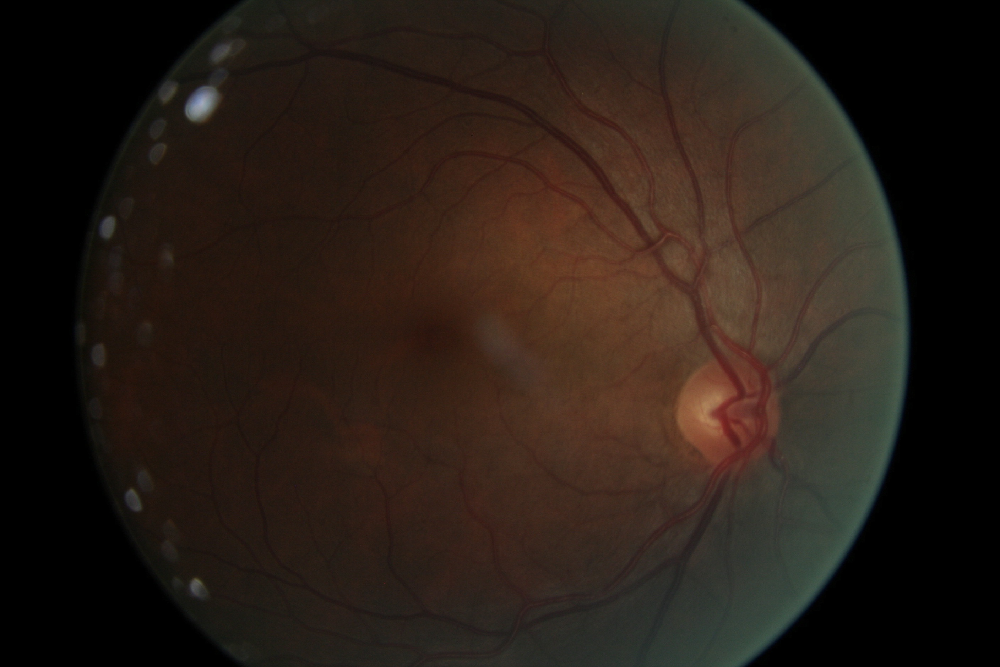

Sharpness


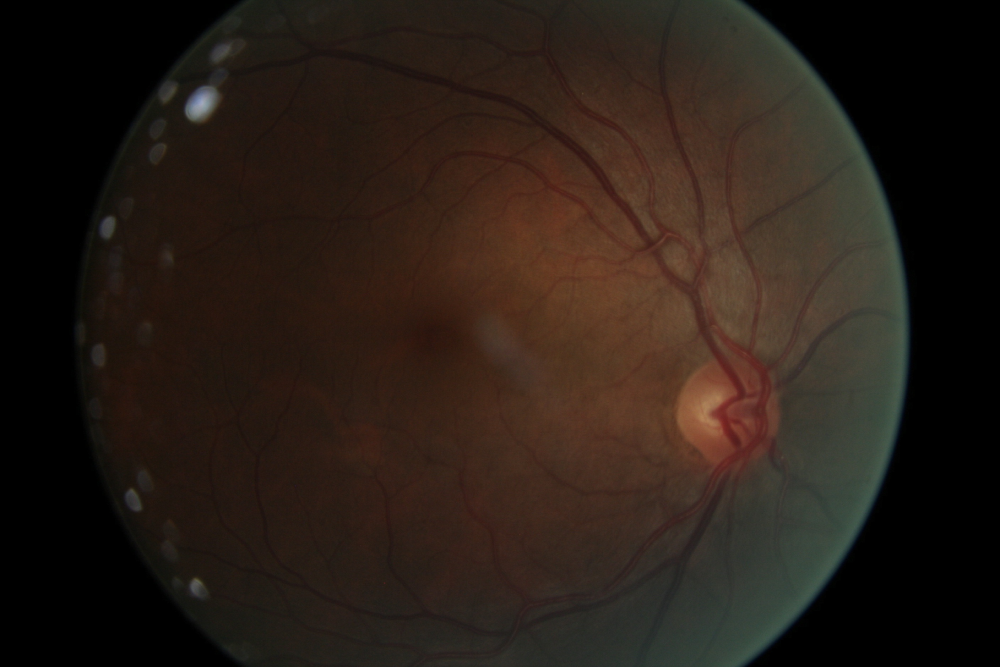

In [40]:
class Spot(object):
    def __init__(self,center=None, radius=None,prob = 0.9):
        self.size = 1870
        self.center = center
        self.radius = radius
        self.prob = prob
        self.zeros = torch.zeros((self.size, self.size)) #.cuda()
        self.ones = torch.ones((3,1)) #.cuda()

        self.to_image_transform = T.ToPILImage()
        self.to_tensor_transform = T.PILToTensor()
        
    def __call__(self, image, target=None):
        if random.random() < self.prob:
            #print('Spot')
            s_num =random.randint(5,10)
            # s_num = 1
            mask0 = self.zeros.clone()
            center=self.center
            radius=self.radius
            
            image = self.to_tensor_transform(image)
            print(image.shape)
            dim1_offset = int((image.shape[1] - self.size)/2)
            dim2_offset = int((image.shape[2] - self.size)/2)
            
            for i in range(s_num):

                radius = random.randint(np.ceil(0.01*self.size),int(0.05*self.size))

                center  = [random.randint(radius+1,self.size-radius-1),random.randint(radius+1,self.size-radius-1)]
                Y, X = np.ogrid[:self.size, :self.size]
                dist_from_center = np.sqrt((X - center[0])**2 + (Y-center[1])**2)
                circle = dist_from_center <= (int(radius/2))

                k = (14/25) +(1.0-radius/25)
                beta = 0.5 + (1.5 - 0.5) * (radius/25)
                A = k * self.ones.clone()
                # print(A.shape)
                d =0.3 *(radius/25)
                t = np.exp(-beta * d)

                mask = self.zeros.clone()
                mask[circle] = torch.multiply(A[0], torch.tensor(1-t)) # .cuda())
                mask0 = mask0 + mask
                mask0[mask0 != 0] = 1

                sigma = (5 + (20 - 0) * (radius/25))*2
                rad_w = random.randint(int(sigma / 5), int(sigma / 4))
                rad_h = random.randint(int(sigma / 5), int(sigma / 4))
                if (rad_w % 2) == 0: rad_w = rad_w + 1
                if (rad_h % 2) == 0: rad_h = rad_h + 1

                mask = F.gaussian_blur(torch.reshape(mask,(1,self.size,self.size)), (rad_w, rad_h), sigma)
                mask = torch.stack([mask, mask, mask])*192

                # print(self.to_tensor_transform(image).min(), self.to_tensor_transform(image).max())
                # print(mask.min(), mask.max())
                
                image[:, dim1_offset:dim1_offset+self.size, dim2_offset:dim2_offset+self.size] = image[:, dim1_offset:dim1_offset+self.size, dim2_offset:dim2_offset+self.size] + torch.reshape(mask,(3,self.size,self.size))
                
            image = self.to_image_transform(torch.clamp(image,min=0,max=192))

        return image

class Blur(object):
    def __init__(self, sigma=None, prob = 0.3):
        self.level_range = [0.1, 1]
        self.sigma = sigma
        self.prob = prob

    def __get_parameter(self):
        return np.random.uniform(self.level_range[0], self.level_range[1])

    def __call__(self, image, target=None):
        if random.random() < self.prob:
           
            rad_w = random.randint(10, 35)
            if (rad_w % 2) == 0: rad_w = rad_w + 1
            rad_h = rad_w
            print(rad_h)
            image = F.gaussian_blur(image, (rad_w,rad_h))

        return image

class Sharpness(object):
    def __init__(self, level=None, prob = 0.5):
        
        self.level_range = [0, 2]
        self.prob = prob

    def __get_parameter(self):
        return np.random.uniform(self.level_range[0], self.level_range[1])

    def __call__(self, image, target=None):
        if random.random() < self.prob:
            # print('Sharpness')
            sharpness_factor = self.__get_parameter()
            image = F.adjust_sharpness(image, sharpness_factor)
        return image

# transform = Spot()
# transform = Blur()
transform = Sharpness()
file_name = '../mnt/local/data/kalexu97/large_dataset/train/0/35062_left.jpeg'
image = Image.open(file_name)
display(image)
image = transform(image)
display(image)


Predicted class: 0


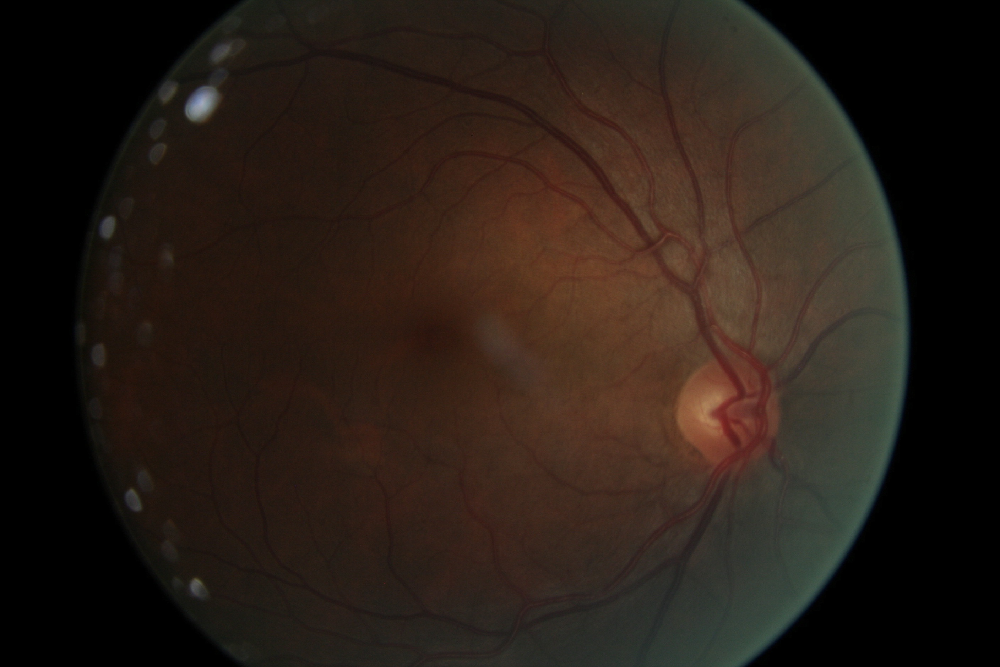

In [2]:
from transformers import AutoFeatureExtractor, SwinForImageClassification
from PIL import Image

file_name = '../mnt/local/data/kalexu97/large_dataset/train/0/35062_left.jpeg'
image = Image.open(file_name)

feature_extractor = AutoFeatureExtractor.from_pretrained("./saved_models/swin384_originpreprocessor_rt15")
model = SwinForImageClassification.from_pretrained("./saved_models/swin384_originpreprocessor_rt15")

inputs = feature_extractor(images=image, return_tensors="pt")
outputs = model(**inputs)
logits = outputs.logits
# model predicts one of the 1000 ImageNet classes
predicted_class_idx = logits.argmax(-1).item()
print("Predicted class:", model.config.id2label[predicted_class_idx])
display(image)

In [17]:
from transformers import AutoFeatureExtractor
from transformers import ViTImageProcessor

# feature_extractor = AutoFeatureExtractor.from_pretrained("microsoft/swin-base-patch4-window12-384")
feature_extractor = ViTImageProcessor.from_pretrained("microsoft/swin-base-patch4-window12-384")